# Define data to visualise

In [1]:
# downloaded from https://nomads.ncdc.noaa.gov/data/gfs-avn-hi/201805/20180508/
data_file = 'gfs_3_20180508_0000_000.grb2' 
data_type = "V component of wind"

# Imports

In [2]:
import pygrib
import os
import numpy as np

from matplotlib import pyplot as plt
from matplotlib import colors
from mpl_toolkits.basemap import Basemap, addcyclic

import plotly.graph_objs as go
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
import plotly.figure_factory as ff

import ipywidgets

init_notebook_mode(connected=True)

In [3]:
%matplotlib inline

# Define functions

## Define a function that takes a list of pygrib.gribmessage objects and returns a dictionary, where the key 'data' contains a 3D tensor with data from the pygrib.gribmessage objects

In [4]:
def grb_to_grid(grb_obj):
    """Takes a single grb object containing multiple
    levels. Assumes same time, pressure levels. Compiles to a cube"""
    n_levels = len(grb_obj)
    levels = np.array([grb_element['level'] for grb_element in grb_obj])
    indexes = np.argsort(levels)[::-1] # highest pressure first
    cube = np.zeros([n_levels, grb_obj[0].values.shape[0], grb_obj[1].values.shape[1]])
    for i in range(n_levels):
        cube[i,:,:] = grb_obj[indexes[i]].values
    cube_dict = {'data' : cube, 'units' : grb_obj[0]['units'],
                 'levels' : levels[indexes]}
    return cube_dict

### Define functions to return outlines of countries and coastlines

In [5]:
# Make trace-generating function (return a Scatter object)
def make_scatter(x,y):
    return go.Scatter(
        x=x,
        y=y,
        mode='lines',
        line=go.scatter.Line(color="black"),
        name=' '  # no name on hover
    )

# Functions converting coastline/country polygons to lon/lat traces
def polygons_to_traces(poly_paths, N_poly, basemap_map):
    ''' 
    pos arg 1. (poly_paths): paths to polygons
    pos arg 2. (N_poly): number of polygon to convert
    '''
    traces = []  # init. plotting list 

    for i_poly in range(N_poly):
        poly_path = poly_paths[i_poly]
        
        # get the Basemap coordinates of each segment
        coords_cc = np.array(
            [(vertex[0],vertex[1]) 
             for (vertex,code) in poly_path.iter_segments(simplify=False)]
        )
        
        # convert coordinates to lon/lat by 'inverting' the Basemap projection
        lon_cc, lat_cc = basemap_map(coords_cc[:,0],coords_cc[:,1], inverse=True)
        
        # add plot.ly plotting options
        traces.append(make_scatter(lon_cc,lat_cc))
     
    return traces

# Function generating coastline lon/lat traces
def get_coastline_traces(basemap_map):
    poly_paths = basemap_map.drawcoastlines().get_paths() # coastline polygon paths
    N_poly = 91 # use only the 91st biggest coastlines (i.e. no rivers)
    return polygons_to_traces(poly_paths, N_poly, basemap_map)

# Function generating country lon/lat traces
def get_country_traces(basemap_map):
    poly_paths = basemap_map.drawcountries().get_paths() # country polygon paths
    N_poly = len(poly_paths)  # use all countries
    return polygons_to_traces(poly_paths, N_poly, basemap_map)


# Load data

In [6]:
data_folder = os.path.join(os.path.expanduser('~'), 'Documents', 'Projects', 'WeatherWind', 'data')
grbs = pygrib.open(os.path.join(data_folder, data_file))
grb = grbs.readline()
lats,lons = grb.latlons()

In [7]:
grb_data = grbs.select(name=data_type)
grb_cube_data=grb_to_grid(grb_data)

In [8]:
lons_rotated = lons.copy()
lons_rotated[lons >= 180] = lons[lons >= 180] - 360

# proper rotation obtained from: https://plot.ly/ipython-notebooks/basemap-maps/
i_east = lons_rotated[0, :] >= 0  # indices of east lon
i_west = lons_rotated[0, :] < 0   # indices of west lon
lons_rotated = np.hstack((lons_rotated[:, i_west], lons_rotated[:, i_east]))  # stack the 2 halves

# Correspondingly, shift the data array
tmp_data = grb_cube_data['data'][10]
data_rotated = np.hstack((tmp_data[:,i_west], tmp_data[:,i_east]))

In [9]:
m_rotated = Basemap(llcrnrlon = -179, llcrnrlat = -89, urcrnrlon = 180,
           urcrnrlat = 89 , projection = 'mill', area_thresh =10000,
           resolution='l')

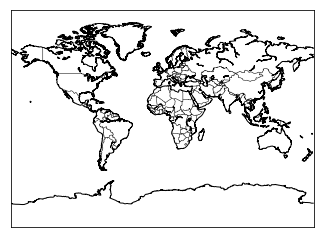

In [10]:
# Get list of of coastline and country lon/lat traces
traces_cc = get_coastline_traces(m_rotated)+get_country_traces(m_rotated)

# Define figure

In [11]:
anno_text = "Data from NOAA"
#"Data courtesy of \
#<a href='http://www.esrl.noaa.gov/psd/data/composites/day/'>\
#NOAA Earth System Research Laboratory</a>"

axis_style = dict(
    zeroline=False,
    showline=False,
    showgrid=False,
    ticks='',
    showticklabels=True,
)

layout1 = go.Layout(
    title=data_type,
    showlegend=False,
    hovermode="closest", # highlight closest point on hover
    margin = {'t':100, 'b':60, 'l':60, 'r':0, 'pad':8}, 
    xaxis=go.layout.XAxis(
        axis_style,
        range = [-180, 180]  # restrict y-axis to range of lon
    ),
    yaxis=go.layout.YAxis(
        axis_style,
        range=[-85, 85]
    ),
    annotations=[
        dict(
            text=anno_text,
            xref='paper',
            yref='paper',
            x=0,
            y=1,
            yanchor='bottom',
            showarrow=False
        )
    ],
    autosize=False,
    width=600,
    height=500
)

# Plot the figure

In [12]:
fig1 = go.Figure(data=traces_cc + [go.Contour(z=data_rotated, x=lons_rotated[0, :], y=lats[:, 0])], layout=layout1)

fig1['layout']['xaxis']['fixedrange'] = False 
fig1['layout']['yaxis']['fixedrange'] = False 
config = {'scrollZoom': True}
iplot(fig1, filename="maps", config=config)

# Plots side-by-side

In [13]:

fw1 = go.FigureWidget(data=fig1.data, layout=fig1.layout)
fw2 = go.FigureWidget(data=fig1.data, layout=fig1.layout)

In [14]:
# https://community.plot.ly/t/plotly-subplots-using-fig-objects-instead-of-traces/11969/4
fig_subplots = ipywidgets.HBox([fw1, fw2], config=config)

In [15]:
fig_subplots

    'data': [{'line': {'color': 'black'},
              'mode': 'lines',
       …